In [1]:
from bloch import bloch
from bloch.bloch import kronigPenney
from bloch.bloch import blochModel

import torch
import numpy as np
import matplotlib.pyplot as plot
plot.rcParams['figure.facecolor'] = 'white'

torch.backends.cuda.matmul.allow_tf32 = False

Tesla V100-PCIE-16GB
11.6


In [2]:
# train network
# Set b1 the V zone b2 the zero zone 
b1 = 0.1#2*np.pi/8
b2 = 1-b1#6*np.pi/8

period = abs(b2+b1)
delta = 0

cellsize = np.pi/period

k1 = cellsize
k2 = 2*cellsize#3*cellsize+(1/4)*cellsize
k1d = k1-delta
k2d = k2+delta



# Set V the well depth
V = -5
npts = 40 # MUST BE EVEN

neurons = 64#80 # total hidden layer neurons 
epochs = 150000 # total max allowed epochs ~30 MINS PER 100k AT 150 SP 
lr =  8e-4#learning rate 2e-4 at 0.5 decay works
lrdecay = 0.3
decayratio = 0.01 #multiply lr*lrceday at epoch (decayratio*epochs)+1 
minLoss =  0.0001#0.0002 #0.00005 # SET TO -1 FOR NO LOSS LIMIT
samplePoints = 200## number of training points per epoch
FOLDER = 'blochmodels/9/'
PATH = FOLDER+'bloch4'

eqParams = [b1,b2,k1d,k2d,V,period,npts,decayratio]
netParams = [neurons, samplePoints, epochs, lr, minLoss, lrdecay]

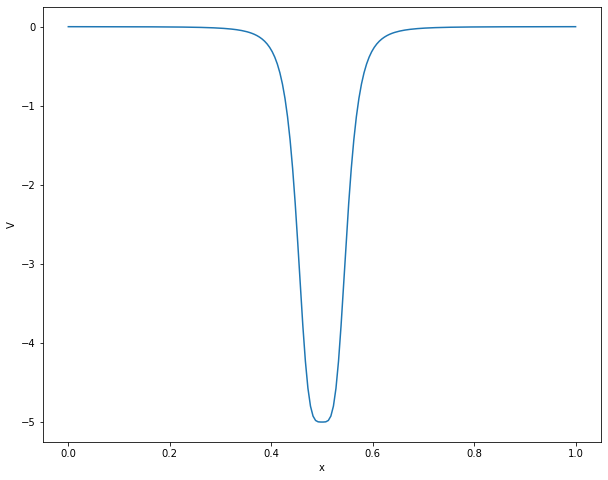

In [3]:
plot.figure(figsize =(10,8))
plotxs = np.linspace(0,period,samplePoints)
#V = kronigPenney(grid, v, width, b2)
plotVs = kronigPenney(torch.tensor(plotxs).cuda(),V, period, b1,npts)
plot.plot(plotxs, plotVs.cpu())
plot.xlabel('x')
plot.ylabel('V')
plot.show()

In [4]:
model, lastmodel, runTime, total_epochs, lossHistory, tHistory, EHistory = blochModel(eqParams, netParams, PATH, verbose=False)
b1model = model

[0.1, 0.9, 3.141592653589793, 6.283185307179586, -5, 1.0, 40, 0.01]
torch.Size([40000, 1])
torch.Size([40000, 1])
Total runtime: 4201.78 seconds
Final LR: 0.0002399999999999996


Final loss: 0.0017876


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
/n/home00/circehsu/.conda/envs/torch-11.6/lib/python3.10/site-packages/torch/_tensor.py:759: ComplexWarning: Casting complex values to real discards the imaginary part
  return self.numpy().astype(dtype, copy=False)
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
/n/home00/circehsu/.conda/envs/torch-11.6/lib/python3.10/site-packages/torch/_tensor.py:759: ComplexWarning: Casting complex values to real discards the imaginary part
  return self.numpy().astype(dtype, copy=False)
/n/home00/circehsu/.conda/envs/torch-11.6/lib/python3.10/site-packages/torch/_tensor.py:759: Comp

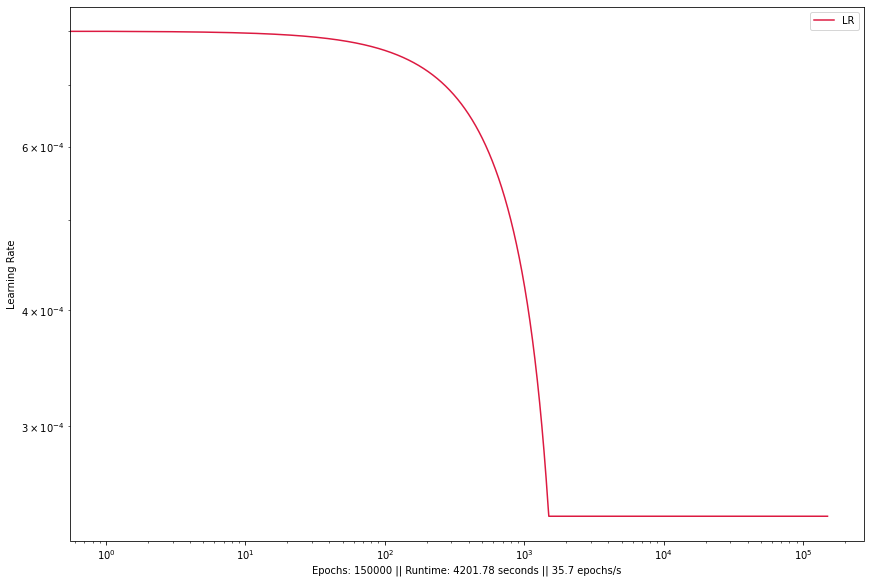

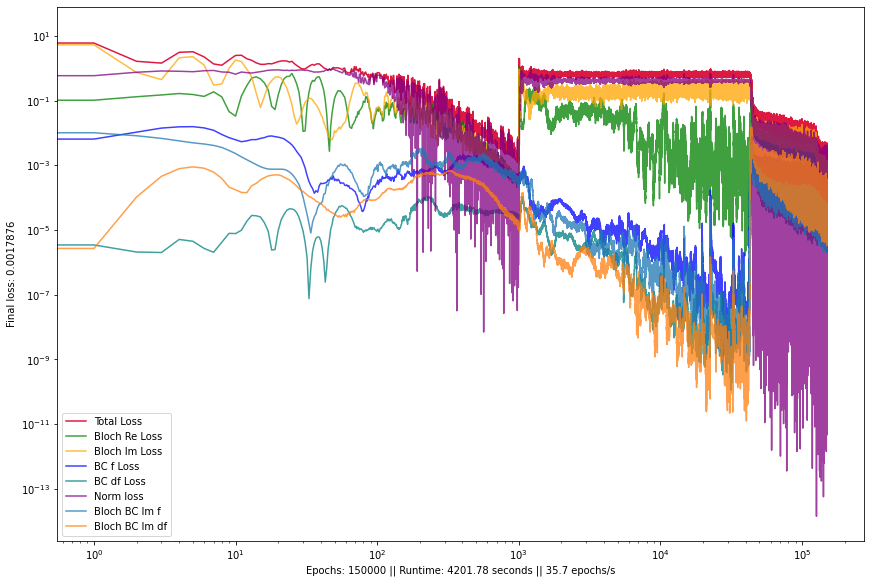

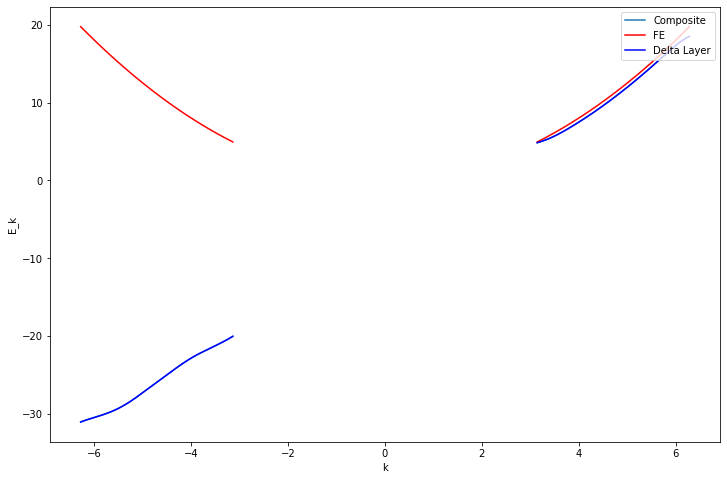

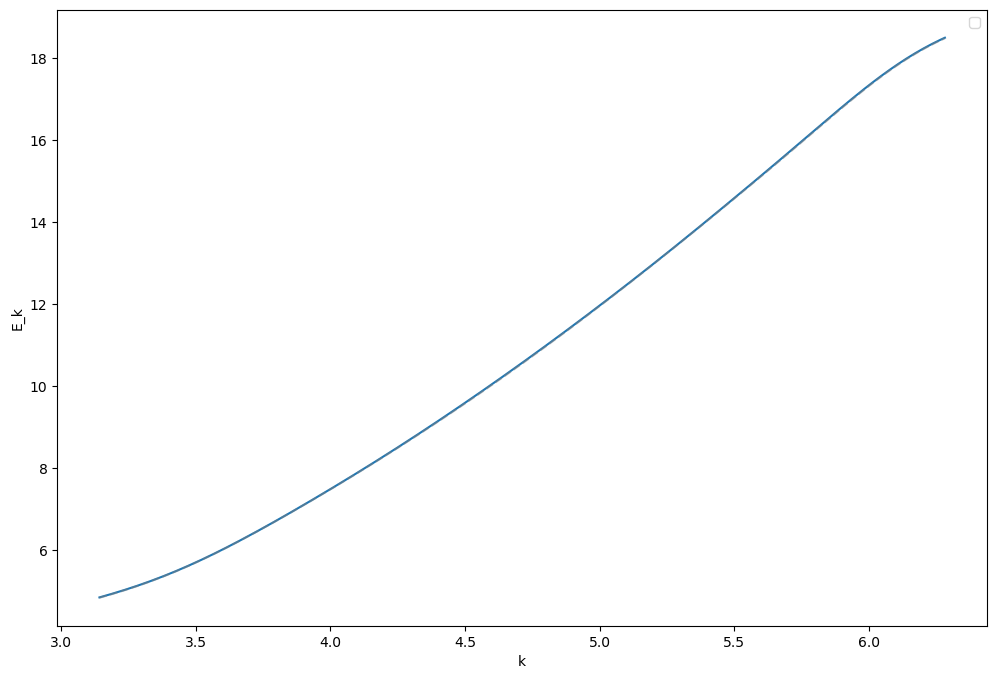

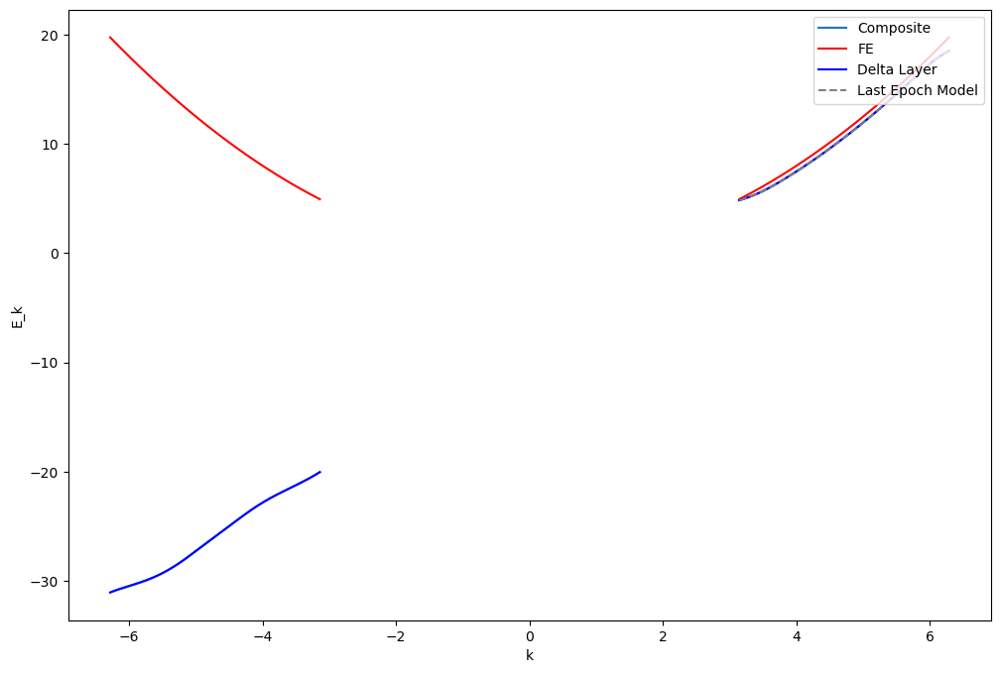

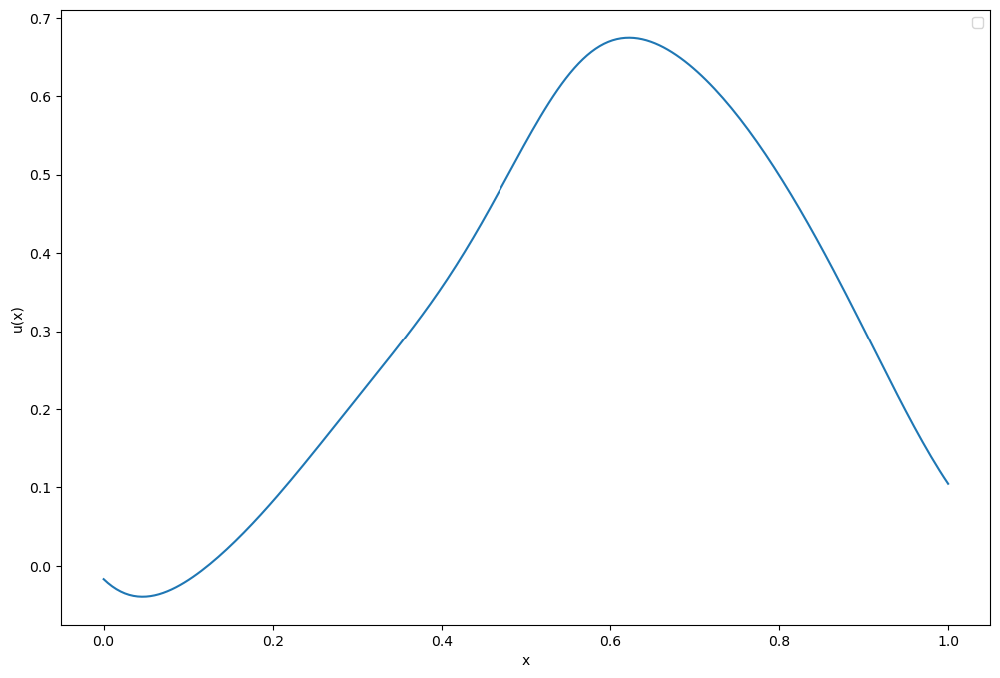

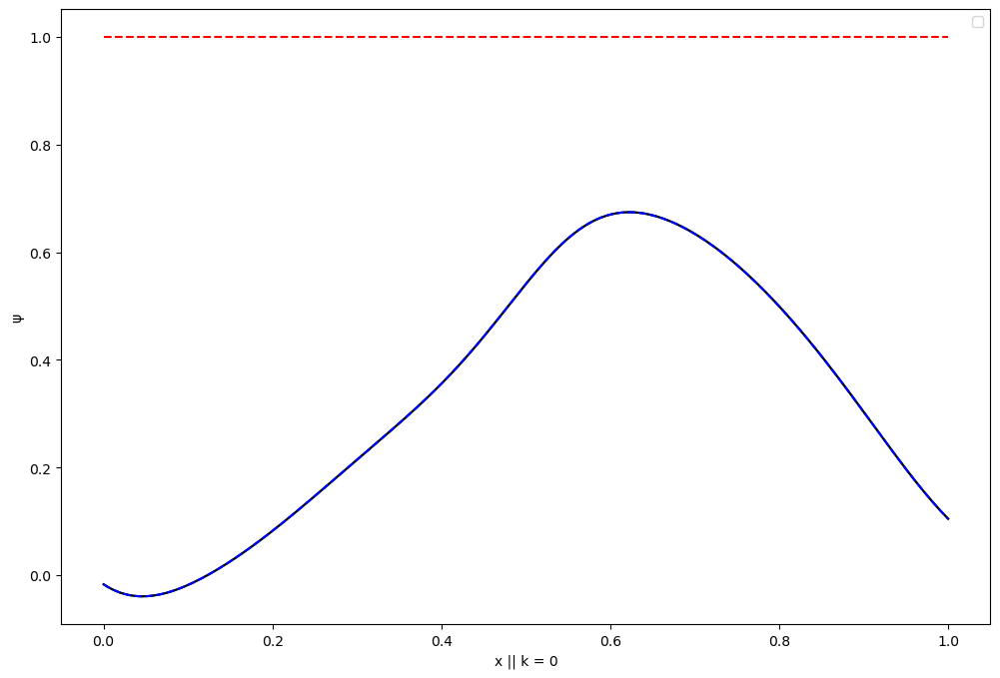

In [5]:
plot.figure(figsize =(12,8))
plot.loglog(lossHistory[6],'crimson',alpha=0.975,label='LR'); # total loss

plot.tight_layout()
plot.ylabel('Learning Rate')
plot.xlabel('Epochs: ' + str(total_epochs) + ' || Runtime: ' + str(round(runTime,2)) + ' seconds || ' + str(round(total_epochs/runTime,2)) + ' epochs/s')
#plot.savefig('infinitewell/tanhsin/SE_loss_sinwigglyboy_e3.png')
plot.legend(loc='upper right')
plot.plot()
print('Final loss: ' + str(round(lossHistory[0][-1],7)))

############################################################################################################################

plot.figure(figsize =(12,8))
plot.loglog(lossHistory[0],'crimson',alpha=0.975,label='Total Loss'); # total loss
plot.loglog(lossHistory[1],'-g',alpha=0.75,label='Bloch Re Loss'); # sde loss
plot.loglog(lossHistory[7],'orange',alpha=0.75,label='Bloch Im Loss');
plot.loglog(lossHistory[2],'-b',alpha=0.75,label='BC f Loss'); # trivial loss
plot.loglog(lossHistory[3],'teal',alpha=0.75,label='BC df Loss');# right side loss
plot.loglog(lossHistory[4],'purple',alpha=0.75,label='Norm loss');
plot.loglog(lossHistory[8],alpha=0.75,label='Bloch BC Im f');
plot.loglog(lossHistory[9],alpha=0.75,label='Bloch BC Im df');


plot.tight_layout()
plot.ylabel('Final loss: ' + str(round(lossHistory[0][-1],7)));plot.xlabel('Epochs: ' + str(total_epochs) + ' || Runtime: ' + str(round(runTime,2)) + ' seconds || ' + str(round(total_epochs/runTime,2)) + ' epochs/s')
#plot.savefig('infinitewell/tanhsin/SE_loss_sinwigglyboy_e3.png')
plot.legend(loc='lower left')
plot.plot()
plot.savefig('lossplot.png')
############################################################################################################################

plot.figure(figsize = (12,8))
plot.rcdefaults()
#plot.rcParams['axes.edgecolor'] = 'red'
plot.rcParams['figure.facecolor'] = 'white'
#plotys = finiteWell(torch.tensor(plotxs),V,b1,b2)
modelxs = torch.linspace(0,period,samplePoints).reshape(-1,1).cuda()
modelks = torch.linspace(k1,k2,samplePoints).reshape(-1,1).cuda()

modelSolution, lj, nfe, delta  = b1model(modelxs,modelks)
plot.plot(modelks.cpu(),lj.cpu().detach().numpy(),color='C0',label='Composite')
plot.plot(modelks.cpu(),nfe.cpu().detach().numpy(),color='red',label='FE')
plot.plot(modelks.cpu(),delta[-1].cpu().detach().numpy(),color='blue',label='Delta Layer')



modelSolution, lj, nfe, delta = b1model(modelxs,-1*modelks)
#delta = delta[1].reshape(-1,1).cuda()
plot.plot(-1*modelks.cpu(),lj.cpu().detach().numpy(),color='C0')
plot.plot(-1*modelks.cpu(),nfe.cpu().detach().numpy(),color='red')
plot.plot(-1*modelks.cpu(),delta[-1].cpu().detach().numpy(),color='blue')


#plot.xlim([-2,2])
#plot.ylim([-1,5])
plot.legend(loc='upper right')
plot.xlabel('k')
plot.ylabel('E_k')
plot.savefig('deltacomposite.png')

############################################################################################################################

plot.figure(figsize = (12,8))
plot.rcdefaults()
#plot.rcParams['axes.edgecolor'] = 'red'
plot.rcParams['figure.facecolor'] = 'white'
#plotys = finiteWell(torch.tensor(plotxs),V,b1,b2)
modelxs = torch.linspace(0,period,samplePoints).reshape(-1,1).cuda()
modelks = torch.linspace(k1,k2,samplePoints).reshape(-1,1).cuda()
modelSolution, lj, nfe, delta = b1model(modelxs,modelks)
plot.plot(modelks.cpu(),lj.cpu().detach().numpy())

modelxs = torch.linspace(0,period,samplePoints).reshape(-1,1).cuda()
modelks = torch.linspace(k1,k2,samplePoints).reshape(-1,1).cuda()
modelSolution, lj, nfe, delta = lastmodel(modelxs,modelks)
plot.plot(modelks.cpu(),lj.cpu().detach().numpy(),alpha=0.5,color='grey',linestyle='--')
#plot.xlim([-2,2])
#plot.ylim([-1,5])
plot.legend(loc='upper right')
plot.xlabel('k')
plot.ylabel('E_k')

############################################################################################################################

plot.figure(figsize = (12,8))
plot.rcdefaults()
#plot.rcParams['axes.edgecolor'] = 'red'
plot.rcParams['figure.facecolor'] = 'white'
#plotys = finiteWell(torch.tensor(plotxs),V,b1,b2)
modelxs = torch.linspace(0,period,samplePoints).reshape(-1,1).cuda()
modelks = torch.linspace(k1,k2,samplePoints).reshape(-1,1).cuda()

modelSolution, lj, nfe, delta  = b1model(modelxs,modelks)
plot.plot(modelks.cpu(),lj.cpu().detach().numpy(),color='C0',label='Composite')
plot.plot(modelks.cpu(),nfe.cpu().detach().numpy(),color='red',label='FE')
plot.plot(modelks.cpu(),delta[-1].cpu().detach().numpy(),color='blue',label='Delta Layer')



modelSolution, lj, nfe, delta = b1model(modelxs,-1*modelks)
#delta = delta[1].reshape(-1,1).cuda()
plot.plot(-1*modelks.cpu(),lj.cpu().detach().numpy(),color='C0')
plot.plot(-1*modelks.cpu(),nfe.cpu().detach().numpy(),color='red')
plot.plot(-1*modelks.cpu(),delta[-1].cpu().detach().numpy(),color='blue')

modelSolution, lj, nfe, delta = lastmodel(modelxs,modelks)
plot.plot(modelks.cpu(),lj.cpu().detach().numpy(),color='grey',linestyle='--',label='Last Epoch Model')

#plot.xlim([-2,2])
#plot.ylim([-1,5])
plot.legend(loc='upper right')
plot.xlabel('k')
plot.ylabel('E_k')
plot.savefig('deltacomposite.png')

############################################################################################################################
kval = 0


plot.figure(figsize = (12,8))
plot.rcdefaults()
#plot.rcParams['axes.edgecolor'] = 'red'
plot.rcParams['figure.facecolor'] = 'white'
#plotys = finiteWell(torch.tensor(plotxs),V,b1,b2)
#modelxs = b2*((torch.rand(samplePoints)).reshape(-1,1))-b1
modelxs = torch.linspace(0,period,samplePoints).reshape(-1,1).cuda()
modelks = torch.linspace(kval,kval,samplePoints).reshape(-1,1).cuda()
modelSolution, lj, nfe, delta = model(modelxs,modelks)
plot.plot(modelxs.cpu(),modelSolution[:,0].reshape(-1,1).cpu().detach().numpy())

#plotvx = np.linspace(0,period,samplePoints)
#plotvv = kronigPenney(torch.tensor(plotxs),V, period, b1)
#plot.plot(plotvx, plotvv, color='r', linestyle='--')

#plot.xlim([-1,3])
#plot.ylim([-1,5])
plot.legend(loc='upper right')
plot.xlabel('x')
plot.ylabel('u(x)')

############################################################################################################################

plot.figure(figsize = (12,8))
plot.rcdefaults()
#plot.rcParams['axes.edgecolor'] = 'red'
plot.rcParams['figure.facecolor'] = 'white'
#plotys = finiteWell(torch.tensor(plotxs),V,b1,b2)
#modelxs = b2*((torch.rand(samplePoints)).reshape(-1,1))-b1
modelxs = torch.linspace(0,period,samplePoints).reshape(-1,1).cuda()
modelks = torch.linspace(kval,kval,samplePoints).reshape(-1,1).cuda()
modelSolution, lj, nfe, delta = model(modelxs,modelks)
paraSolution = np.exp(1j*kval*modelxs.cpu())*modelSolution[:,0].reshape(-1,1).cpu().detach().numpy()
plot.plot(modelxs.cpu(),paraSolution)

#plotvx = np.linspace(0,period,samplePoints)
#plotvv = kronigPenney(torch.tensor(plotxs),V, period, b1)
#plot.plot(plotvx, plotvv, color='r', linestyle='--')

#plot.xlim([-1,3])
#plot.ylim([-1,5])
plot.legend(loc='upper right')
plot.xlabel('x')
plot.ylabel('ψ')

############################################################################################################################

plot.plot(modelxs.cpu(),paraSolution,color='black')
plot.plot(modelxs.cpu(),np.exp(1j*kval*modelxs.cpu()),color='red', linestyle='--')
plot.plot(modelxs.cpu(),modelSolution[:,0].reshape(-1,1).cpu().detach().numpy() ,color='blue', linestyle='--')


#plot.xlim([-1,3])
    #plot.ylim([-0.004,0.004])
plot.legend(loc='upper right')
plot.xlabel('x || k = ' + str(round(kval,5)))
plot.ylabel('ψ')
plot.savefig('wavefunc_0.png')

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
/n/home00/circehsu/.conda/envs/torch-11.6/lib/python3.10/site-packages/torch/_tensor.py:759: ComplexWarning: Casting complex values to real discards the imaginary part
  return self.numpy().astype(dtype, copy=False)
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
/n/home00/circehsu/.conda/envs/torch-11.6/lib/python3.10/site-packages/torch/_tensor.py:759: ComplexWarning: Casting complex values to real discards the imaginary part
  return self.numpy().astype(dtype, copy=False)
/n/home00/circehsu/.conda/envs/torch-11.6/lib/python3.10/site-packages/torch/_tensor.py:759: ComplexWarning: Casting complex values to real discards the imaginary part
  return self.numpy().astype(dtype, copy=False)
No artists with labels found to put in

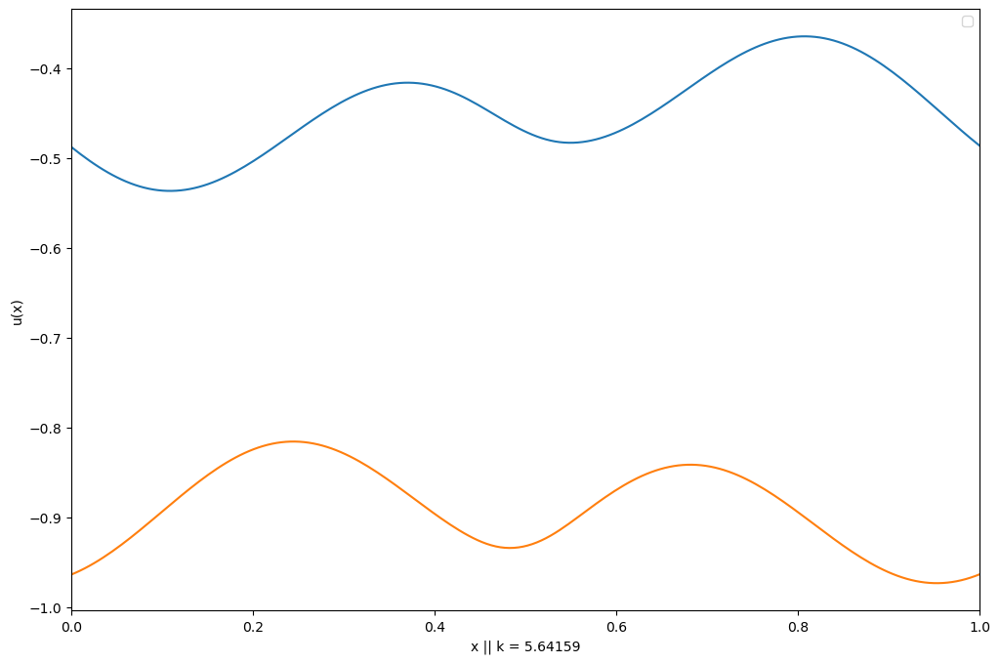

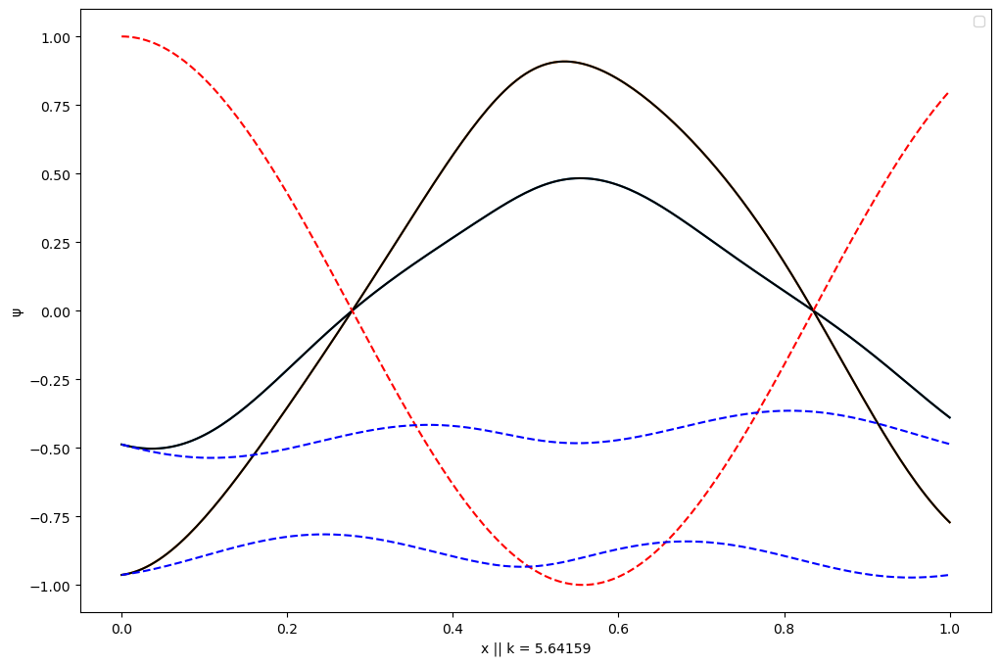

In [6]:
kval = np.pi+2.5


plot.figure(figsize = (12,8))
plot.rcdefaults()
#plot.rcParams['axes.edgecolor'] = 'red'
plot.rcParams['figure.facecolor'] = 'white'
#plotys = finiteWell(torch.tensor(plotxs),V,b1,b2)
#modelxs = b2*((torch.rand(samplePoints)).reshape(-1,1))-b1
modelxs = torch.linspace(0,period,samplePoints).reshape(-1,1).cuda()
modelks = torch.linspace(kval,kval,samplePoints).reshape(-1,1).cuda()
modelSolution, lj, nfe, delta = model(modelxs,modelks)
plot.plot(modelxs.cpu(),modelSolution.cpu().detach().numpy())

#plotvx = np.linspace(0,period,samplePoints)
#plotvv = kronigPenney(torch.tensor(plotxs),V, period, b1)
#plot.plot(plotvx, plotvv, color='r', linestyle='--')

plot.xlim([0,1])
#plot.ylim([-1,5])
plot.legend(loc='upper right')
plot.xlabel('x || k = ' + str(round(kval,5)))
plot.ylabel('u(x)')

############################################################################################################################

plot.figure(figsize = (12,8))
plot.rcdefaults()
#plot.rcParams['axes.edgecolor'] = 'red'
plot.rcParams['figure.facecolor'] = 'white'
#plotys = finiteWell(torch.tensor(plotxs),V,b1,b2)
#modelxs = b2*((torch.rand(samplePoints)).reshape(-1,1))-b1
modelxs = torch.linspace(0,period,samplePoints).reshape(-1,1).cuda()
modelks = torch.linspace(kval,kval,samplePoints).reshape(-1,1).cuda()
modelSolution, lj, nfe, delta = model(modelxs,modelks)
paraSolution = np.exp(1j*kval*modelxs.cpu())*modelSolution.cpu().detach().numpy()
plot.plot(modelxs.cpu(),paraSolution)

#plotvx = np.linspace(0,period,samplePoints)
#plotvv = kronigPenney(torch.tensor(plotxs),V, period, b1)
#plot.plot(plotvx, plotvv, color='r', linestyle='--')

#plot.xlim([-1,3])
#plot.ylim([-1,5])
plot.legend(loc='upper right')
plot.xlabel('x || k = ' + str(round(kval,5)))
plot.ylabel('ψ')

############################################################################################################################

plot.plot(modelxs.cpu(),paraSolution,color='black')
plot.plot(modelxs.cpu(),np.exp(1j*kval*modelxs.cpu()),color='red', linestyle='--')
plot.plot(modelxs.cpu(),modelSolution.cpu().detach().numpy() ,color='blue', linestyle='--')


#plot.xlim([-1,3])
    #plot.ylim([-0.004,0.004])
plot.legend(loc='upper right')
plot.xlabel('x || k = ' + str(round(kval,5)))
plot.ylabel('ψ')
plot.savefig('wavefunc_1.png')

In [7]:
from numpy import abs,arccos,linspace,array,pi
from cmath import sqrt,sin,cos,cosh,sinh
from scipy import real_if_close
import matplotlib.pyplot as plt
from ipywidgets import interact
%matplotlib inline

hbar = 1 #1.05457*10**-34 
echarge = 1#1.602*10**-19
emass = 1 #9.109*10**-31 

def bandfunc(a,b,energy,v0):
    #b is the width of the potential barriers and a is the distance between them
    #energy is the value of energy in ElectronVolts that we are solving for
    #v0 is the height of the potential barriers in ElectronVolts
    if(energy==v0):
        return(None)
    result = None
    energy = energy*echarge
    v0 = v0*echarge
    #b = b*10**-10
    #a = a*10**-10
    
    alpha = sqrt((2*emass/hbar**2)*energy)
    beta = sqrt(2*emass*(v0-energy)/hbar**2)
    AlphaBeta_term = (beta**2 - alpha**2) /(2*alpha*beta)
    trace = cos(alpha*a)*cosh(beta*b) + AlphaBeta_term*sin(alpha*a)*sinh(beta*b)
    if abs(trace) < 1:
        result = real_if_close(arccos(trace))
    return(result)

/n/home00/circehsu/.conda/envs/torch-11.6/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.1
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


/tmp/ipykernel_64842/1466432258.py:29: DeprecationWarning: scipy.real_if_close is deprecated and will be removed in SciPy 2.0.0, use numpy.real_if_close instead
  result = real_if_close(arccos(trace))


Text(0, 0.5, 'E(k)')

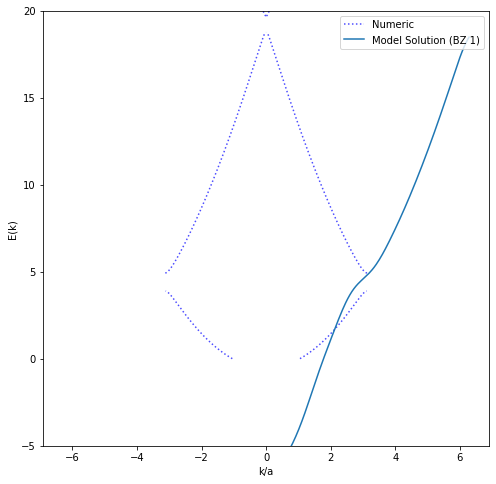

In [8]:
plot.figure(figsize = (8,8))    
plot.rcdefaults()
#plot.rcParams['axes.edgecolor'] = 'red'
plot.rcParams['figure.facecolor'] = 'white'

a = (b2) # A IS THE PERIOD
b = b1
v0 = V

energy_array = linspace(0.01,50,5000)
#Calulate the positive k values
k_vals = array([bandfunc(a,b,energy,v0) for energy in energy_array])
#The negative k-values are just a mirror image of the positive ones
neg_k_vals = array([-k if k is not None else None for k in k_vals])
#generate the plot
plotkvals = linspace(0,np.pi/period,samplePoints)


# ughhhhhhhhhh
for i in range(len(k_vals)):
    if k_vals[i] is not None:
        k_vals[i] = (k_vals[i])/period
        
for i in range(len(neg_k_vals)):
    if neg_k_vals[i] is not None:
        neg_k_vals[i] = (neg_k_vals[i])/period


plt.plot(k_vals,energy_array,'b',alpha=0.7,linestyle=':',label='Numeric');
plt.plot(neg_k_vals,energy_array,'b',alpha=0.7,linestyle=':');
    

#plotys = finiteWell(torch.tensor(plotxs),V,b1,b2)
modelxs = torch.linspace(0,period,samplePoints).reshape(-1,1).cuda()
modelks = torch.linspace(0,k2,samplePoints).reshape(-1,1).cuda()
plotks = torch.linspace(0,k2,samplePoints).reshape(-1,1).cuda()


modelSolution, lj, nfe, delta  = b1model(modelxs,modelks)
plot.plot((plotks.cpu().detach().numpy()),lj.cpu().detach().numpy(),color='C0',label='Model Solution (BZ 1)')

modelSolution, lj, nfe, delta  = b1model(modelxs,-1*modelks)
plot.plot(-1*(plotks.cpu().detach().numpy()),lj.cpu().detach().numpy(),color='C0')

########################################################################

# modelxs = torch.linspace(0,period,samplePoints).reshape(-1,1).cuda()
# modelks = torch.linspace(np.pi/period,2*np.pi/period,samplePoints).reshape(-1,1).cuda()

# modelSolution, lj = b2model(modelxs,modelks)
# plot.plot((plotks.cpu().detach().numpy()/period) - np.pi, lj.cpu().detach().numpy() ,color='red',label='Model Solution (BZ 2)')

# modelSolution, lj = b2model(modelxs,-1*modelks)
# plot.plot(-1*(plotks.cpu().detach().numpy()/period) + np.pi, lj.cpu().detach().numpy() ,color='red')

# ########################################################################

# modelxs = torch.linspace(0,period,samplePoints).reshape(-1,1).cuda()
# modelks = torch.linspace(2*np.pi/period,3*np.pi/period,samplePoints).reshape(-1,1).cuda()

# modelSolution, lj = b3model(modelxs,modelks)
# plot.plot((plotks.cpu().detach().numpy()/period),lj.cpu().detach().numpy(),color='green',label='Model Solution (BZ 3)')

# modelSolution, lj = b3model(modelxs,-1*modelks)
# plot.plot(-1*(plotks.cpu().detach().numpy()/period),lj.cpu().detach().numpy(),color='green')

#plot.xlim([-2,2])
plot.legend(loc='upper right')
plot.ylim([-5,20])
plot.xlabel('k/a')
plot.ylabel('E(k)')

/tmp/ipykernel_64842/1466432258.py:29: DeprecationWarning: scipy.real_if_close is deprecated and will be removed in SciPy 2.0.0, use numpy.real_if_close instead
  result = real_if_close(arccos(trace))


Text(0, 0.5, 'E(k)')

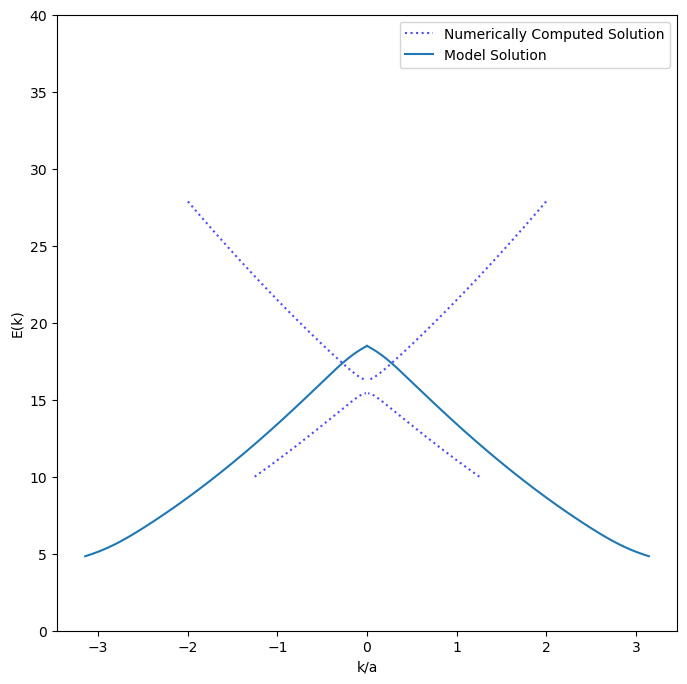

In [9]:
plot.figure(figsize = (8,8))    
plot.rcdefaults()
#plot.rcParams['axes.edgecolor'] = 'red'
plot.rcParams['figure.facecolor'] = 'white'

a = (b2+b1) # A IS THE PERIOD
b = b1
v0 = V

energy_array = linspace(10,28,samplePoints)
#Calulate the positive k values
k_vals = array([bandfunc(a,b,energy,v0) for energy in energy_array])
#The negative k-values are just a mirror image of the positive ones
neg_k_vals = array([-k if k is not None else None for k in k_vals])


plt.plot(k_vals,energy_array,'b',alpha=0.7,linestyle=':',label='Numerically Computed Solution');
plt.plot(neg_k_vals,energy_array,'b',alpha=0.7,linestyle=':');
    

#plotys = finiteWell(torch.tensor(plotxs),V,b1,b2)
modelxs = torch.linspace(0,period,samplePoints).reshape(-1,1).cuda()
modelks = torch.linspace(k1,k2,samplePoints).reshape(-1,1).cuda()
plotks = torch.linspace(k1,k2,samplePoints).reshape(-1,1).cuda()


modelSolution, lj, nfe, delta  = b1model(modelxs,modelks)
plot.plot(modelks.cpu().detach().numpy()-2*cellsize,lj.cpu().detach().numpy(),color='C0',label='Model Solution')

#modelSolution, lj, nfe, delta  = b1model(modelxs,-1*modelks)
plot.plot(-1*modelks.cpu().detach().numpy()+2*cellsize,lj.cpu().detach().numpy(),color='C0')

########################################################################

# modelxs = torch.linspace(0,period,samplePoints).reshape(-1,1).cuda()
# modelks = torch.linspace(np.pi/period,2*np.pi/period,samplePoints).reshape(-1,1).cuda()

# modelSolution, lj = b2model(modelxs,modelks)
# plot.plot(modelks.cpu().detach().numpy(), lj.cpu().detach().numpy() ,color='red',label='Model Solution (BZ 2 & 4)')

# modelSolution, lj = b2model(modelxs,-1*modelks)
# plot.plot(modelks.cpu().detach().numpy(), lj.cpu().detach().numpy() ,color='red')

# ########################################################################

# modelxs = torch.linspace(0,period,samplePoints).reshape(-1,1).cuda()
# modelks = torch.linspace(2*np.pi/period,3*np.pi/period,samplePoints).reshape(-1,1).cuda()

# modelSolution, lj = b3model(modelxs,modelks)
# plot.plot(modelks.cpu().detach().numpy(),lj.cpu().detach().numpy(),color='C0')

# modelSolution, lj = b3model(modelxs,-1*modelks)
# plot.plot(modelks.cpu().detach().numpy(),lj.cpu().detach().numpy(),color='C0')

#plot.xlim([-2,2])
plot.legend(loc='upper right')
plot.ylim([0,40])
plot.xlabel('k/a')
plot.ylabel('E(k)')

/tmp/ipykernel_64842/1466432258.py:29: DeprecationWarning: scipy.real_if_close is deprecated and will be removed in SciPy 2.0.0, use numpy.real_if_close instead
  result = real_if_close(arccos(trace))


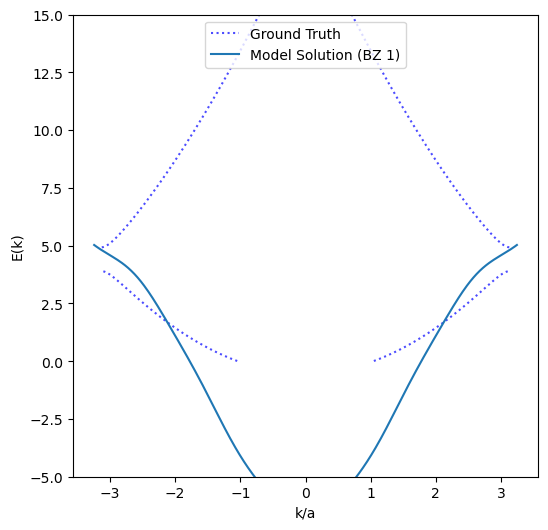

In [10]:
plot.figure(figsize = (6,6))    
plot.rcdefaults()
#plot.rcParams['axes.edgecolor'] = 'red'
plot.rcParams['figure.facecolor'] = 'white'

a = (b2) # A IS THE PERIOD
b = b1
v0 = V

energy_array = linspace(0.01,50,10000)
#Calulate the positive k values
k_vals = array([bandfunc(a,b,energy,v0) for energy in energy_array])
#The negative k-values are just a mirror image of the positive ones
neg_k_vals = array([-k if k is not None else None for k in k_vals])
#generate the plot
plotkvals = linspace(0,np.pi/period,samplePoints)


# ughhhhhhhhhh
for i in range(len(k_vals)):
    if k_vals[i] is not None:
        k_vals[i] = (k_vals[i])/period
        
for i in range(len(neg_k_vals)):
    if neg_k_vals[i] is not None:
        neg_k_vals[i] = (neg_k_vals[i])/period


plt.plot(k_vals,energy_array,'b',alpha=0.7,linestyle=':',label='Ground Truth');
plt.plot(neg_k_vals,energy_array,'b',alpha=0.7,linestyle=':');
    

#plotys = finiteWell(torch.tensor(plotxs),V,b1,b2)
modelxs = torch.linspace(0,period,samplePoints).reshape(-1,1).cuda()
modelks = torch.linspace(0,0.1+np.pi/period,samplePoints).reshape(-1,1).cuda()
plotks = torch.linspace(0,0.1+np.pi,samplePoints).reshape(-1,1).cuda()


modelSolution, lj1, nfe, delta  = b1model(modelxs,modelks)

plot.plot((plotks.cpu().detach().numpy()/period),lj1.cpu().detach().numpy(),color='C0',label='Model Solution (BZ 1)')

plot.plot(-1*(plotks.cpu().detach().numpy()/period),lj1.cpu().detach().numpy(),color='C0')

########################################################################

# modelxs = torch.linspace(0,period,samplePoints).reshape(-1,1).cuda()
# modelks = torch.linspace(np.pi/period,2*np.pi/period,samplePoints).reshape(-1,1).cuda()

# modelSolution, lj2 = b2model(modelxs,modelks)
# plot.plot((plotks.cpu().detach().numpy()/period) - np.pi, lj2.cpu().detach().numpy()+fermi ,color='red',label='Model Solution (BZ 2)')

# modelSolution, lj2n = b2model(modelxs,-1*modelks)
# plot.plot(-1*(plotks.cpu().detach().numpy()/period) + np.pi, lj2n.cpu().detach().numpy()+fermi ,color='red')

# bz2mean = lj2.mean().cpu().detach().numpy()
# ########################################################################

# modelxs = torch.linspace(0,period,samplePoints).reshape(-1,1).cuda()
# modelks = torch.linspace(2*np.pi/period,3*np.pi/period,samplePoints).reshape(-1,1).cuda()

# modelSolution, lj3 = b3model(modelxs,modelks)
# plot.plot((plotks.cpu().detach().numpy()/period),lj3.cpu().detach().numpy()+bz2mean,color='green',label='Model Solution (BZ 3)')

# modelSolution, lj3n = b3model(modelxs,-1*modelks)
# plot.plot(-1*(plotks.cpu().detach().numpy()/period),lj3n.cpu().detach().numpy()+bz2mean,color='green')

#plot.xlim([-2,2])
plot.legend(loc='upper center')
plot.ylim([-5,15])
plot.xlabel('k/a')
plot.ylabel('E(k)')

plot.savefig('aeioauoeu.png')

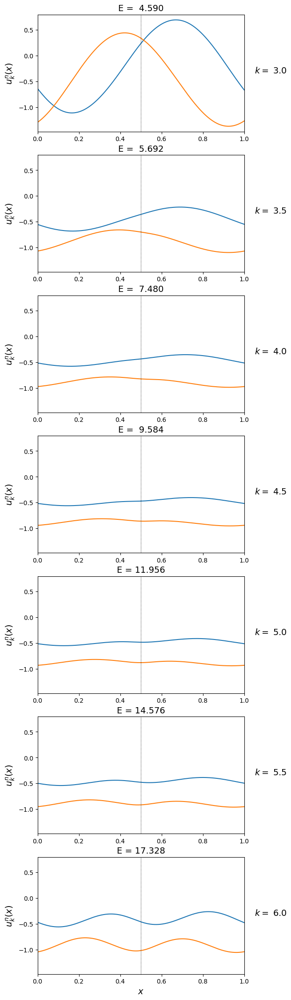

In [11]:
#kvals = [0.0,-0.5,0.5,-1.0,1.0,-1.5,1.5,-2.0,2.0,-2.5,2.5,-3.0,3.0,-1*np.pi,np.pi]  ## half integer k-values seem to give very clean u_k's. Why???
#kvals = [0.0,0.5,1.0,1.5,2.0,2.5,3.0]  ## half integer k-values seem to give very clean u_k's. Why???
kvals = [3.0,3.5,4.0,4.5,5.0,5.5,6.0]

knum = len(kvals)
fig, ax = plt.subplots(knum, 1, figsize=(6,4*knum), sharey=True)

modelxs = torch.linspace(0,period,1000).reshape(-1,1).cuda()

for i in range(len(kvals)):
    for n in range(1):
        modelks = torch.linspace(kvals[i],kvals[i],1000).reshape(-1,1).cuda()
        ukx, ek, nfe, delta  = b1model(modelxs,modelks)

        ax[i].plot(modelxs.cpu().detach().numpy(),ukx[:,0].reshape(-1,1).cpu().detach().numpy(),color='C0')
        ax[i].plot(modelxs.cpu().detach().numpy(),ukx[:,1].reshape(-1,1).cpu().detach().numpy(),color='C1')
        ax[i].plot(-1*modelxs.cpu().detach().numpy(),ukx[:,0].reshape(-1,1).cpu().detach().numpy(),color='C0')
        ax[i].plot(-1*modelxs.cpu().detach().numpy(),ukx[:,1].reshape(-1,1).cpu().detach().numpy(),color='C1')
        #ax[i].set_xlim(-1,1)
        ax[i].set_xlim(0,1)
        ax[i].axvline(x=-0.5,ls=':',lw=0.8,c='k')
        ax[i].axvline(x=0.5,ls=':',lw=0.8,c='k')
        ax[i].set_title('E = {:6.3f}'.format(ek.cpu().detach().mean()),fontsize=14)
    ax[i].set_ylabel('$u_{k}^{n}(x)$',fontsize=14)
#for i in range(1):
ax[-1].set_xlabel('$x$',fontsize=14)
for i in range(knum):
    ax[i].annotate('$k=${:4.2}'.format(kvals[i]),(1.05,0.5),xycoords='axes fraction',fontsize=14)
    
plot.savefig('funcplotb2.png')

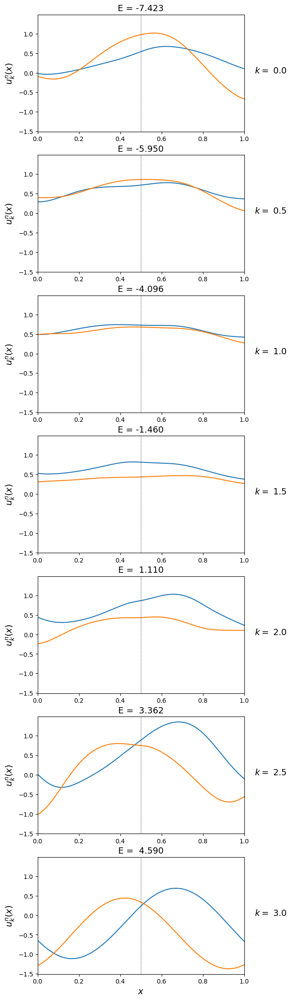

In [12]:
#kvals = [0.0,-0.5,0.5,-1.0,1.0,-1.5,1.5,-2.0,2.0,-2.5,2.5,-3.0,3.0,-1*np.pi,np.pi]  ## half integer k-values seem to give very clean u_k's. Why???
kvals = [0.0,0.5,1.0,1.5,2.0,2.5,3.0]  ## half integer k-values seem to give very clean u_k's. Why???

knum = len(kvals)
fig, ax = plt.subplots(knum, 1, figsize=(6,4*knum), sharey=True)

modelxs = torch.linspace(0,period,1000).reshape(-1,1).cuda()

for i in range(len(kvals)):
    for n in range(1):
        modelks = torch.linspace(kvals[i],kvals[i],1000).reshape(-1,1).cuda()
        ukx, ek, nfe, delta  = b1model(modelxs,modelks)

        ax[i].plot(modelxs.cpu().detach().numpy(),ukx[:,0].reshape(-1,1).cpu().detach().numpy(),color='C0')
        ax[i].plot(modelxs.cpu().detach().numpy(),ukx[:,1].reshape(-1,1).cpu().detach().numpy(),color='C1')
        ax[i].plot(-1*modelxs.cpu().detach().numpy(),ukx[:,0].reshape(-1,1).cpu().detach().numpy(),color='C0')
        ax[i].plot(-1*modelxs.cpu().detach().numpy(),ukx[:,1].reshape(-1,1).cpu().detach().numpy(),color='C1')
        #ax[i].set_xlim(-1,1)
        ax[i].set_xlim(0,1)
        ax[i].axvline(x=-0.5,ls=':',lw=0.8,c='k')
        ax[i].axvline(x=0.5,ls=':',lw=0.8,c='k')
        ax[i].set_title('E = {:6.3f}'.format(ek.cpu().detach().mean()),fontsize=14)
    ax[i].set_ylabel('$u_{k}^{n}(x)$',fontsize=14)
#for i in range(1):
ax[-1].set_xlabel('$x$',fontsize=14)
for i in range(knum):
    ax[i].annotate('$k=${:4.2}'.format(kvals[i]),(1.05,0.5),xycoords='axes fraction',fontsize=14)
    
plot.savefig('funcplotb1.png')

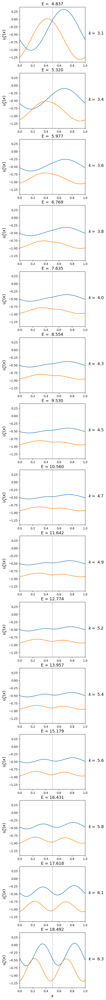

In [13]:
#kvals = [0.0,-0.5,0.5,-1.0,1.0,-1.5,1.5,-2.0,2.0,-2.5,2.5,-3.0,3.0,-1*np.pi,np.pi]  ## half integer k-values seem to give very clean u_k's. Why???
#kvals = [0.0,0.5,1.0,1.5,2.0,2.5,3.0]  ## half integer k-values seem to give very clean u_k's. Why???
kvals = np.linspace(k1,k2,15)

knum = len(kvals)
fig, ax = plt.subplots(knum, 1, figsize=(4,4*knum), sharey=True)

modelxs = torch.linspace(0,period,1000).reshape(-1,1).cuda()

for i in range(len(kvals)):
    for n in range(1):
        modelks = torch.linspace(kvals[i],kvals[i],1000).reshape(-1,1).cuda()
        ukx, ek, nfe, delta  = b1model(modelxs,modelks)

        ax[i].plot(modelxs.cpu().detach().numpy(),ukx[:,0].reshape(-1,1).cpu().detach().numpy(),color='C0')
        ax[i].plot(modelxs.cpu().detach().numpy(),ukx[:,1].reshape(-1,1).cpu().detach().numpy(),color='C1')
        ax[i].plot(-1*modelxs.cpu().detach().numpy(),ukx[:,0].reshape(-1,1).cpu().detach().numpy(),color='C0')
        ax[i].plot(-1*modelxs.cpu().detach().numpy(),ukx[:,1].reshape(-1,1).cpu().detach().numpy(),color='C1')
        #ax[i].set_xlim(-1,1)
        ax[i].set_xlim(0,1)
        ax[i].axvline(x=-0.5,ls=':',lw=0.8,c='k')
        ax[i].axvline(x=0.5,ls=':',lw=0.8,c='k')
        ax[i].set_title('E = {:6.3f}'.format(ek.cpu().detach().mean()),fontsize=14)
    ax[i].set_ylabel('$u_{k}^{n}(x)$',fontsize=14)
#for i in range(1):
ax[-1].set_xlabel('$x$',fontsize=14)
for i in range(knum):
    ax[i].annotate('$k=${:4.2}'.format(kvals[i]),(1.05,0.5),xycoords='axes fraction',fontsize=14)
    
plot.savefig('funcplot.png')

### 

In [14]:
cuda = torch.device('cuda')
print(torch.cuda.get_device_name(cuda))
print(torch.version.cuda)
print(torch.default_generator)

Tesla V100-PCIE-16GB
11.6


/tmp/ipykernel_64842/1466432258.py:29: DeprecationWarning: scipy.real_if_close is deprecated and will be removed in SciPy 2.0.0, use numpy.real_if_close instead
  result = real_if_close(arccos(trace))


Text(0, 0.5, 'E(k)')

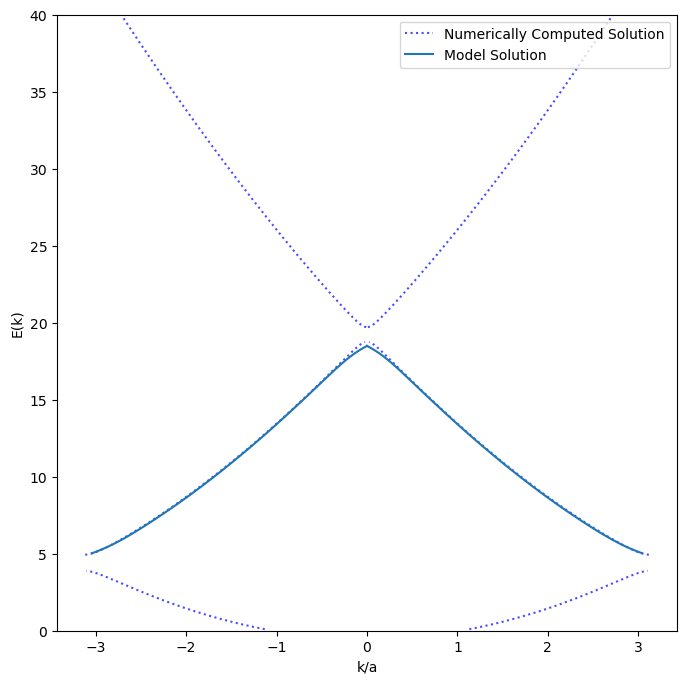

In [15]:
plot.figure(figsize = (8,8))    
plot.rcdefaults()
#plot.rcParams['axes.edgecolor'] = 'red'
plot.rcParams['figure.facecolor'] = 'white'

a = (b2) # A IS THE PERIOD
b = b1
v0 = V

dx = 0.1

energy_array = linspace(0.1,40,1000)
#Calulate the positive k values
k_vals = array([bandfunc(a,b,energy,v0) for energy in energy_array])
#The negative k-values are just a mirror image of the positive ones
neg_k_vals = array([-k if k is not None else None for k in k_vals])


plt.plot(k_vals,energy_array,'b',alpha=0.7,linestyle=':',label='Numerically Computed Solution');
plt.plot(neg_k_vals,energy_array,'b',alpha=0.7,linestyle=':');
    

#plotys = finiteWell(torch.tensor(plotxs),V,b1,b2)
modelxs = torch.linspace(0,period,samplePoints).reshape(-1,1).cuda()
modelks = torch.linspace(0,cellsize-dx,samplePoints).reshape(-1,1).cuda()
plotks = torch.linspace(0,cellsize-dx,samplePoints).reshape(-1,1).cuda()


modelSolution, lj, nfe, delta  = b1model(modelxs,modelks)
#plot.plot(modelks.cpu().detach().numpy(),lj.cpu().detach().numpy(),color='C0',label='Model Solution')

#modelSolution, lj, nfe, delta  = b1model(modelxs,-1*modelks)
#plot.plot(-1*modelks.cpu().detach().numpy(),lj.cpu().detach().numpy(),color='C0')

########################################################################

modelxs = torch.linspace(0,period,samplePoints).reshape(-1,1).cuda()
modelks = torch.linspace(dx+cellsize,2*cellsize,samplePoints).reshape(-1,1).cuda()
plotks = torch.linspace(dx+cellsize,2*cellsize,samplePoints).reshape(-1,1).cuda()


modelSolution, lj, nfe, delta  = b1model(modelxs,modelks)
plot.plot(modelks.cpu().detach().numpy()-2*cellsize,lj.cpu().detach().numpy(),color='C0',label='Model Solution')

#modelSolution, lj, nfe, delta  = b1model(modelxs,-1*modelks)
plot.plot(-1*modelks.cpu().detach().numpy()+2*cellsize,lj.cpu().detach().numpy(),color='C0')

# ########################################################################

# modelxs = torch.linspace(0,period,samplePoints).reshape(-1,1).cuda()
# modelks = torch.linspace(2*np.pi/period,3*np.pi/period,samplePoints).reshape(-1,1).cuda()

# modelSolution, lj = b3model(modelxs,modelks)
# plot.plot(modelks.cpu().detach().numpy(),lj.cpu().detach().numpy(),color='C0')

# modelSolution, lj = b3model(modelxs,-1*modelks)
# plot.plot(modelks.cpu().detach().numpy(),lj.cpu().detach().numpy(),color='C0')

#plot.xlim([-2,2])
plot.legend(loc='upper right')
plot.ylim([0,40])
plot.xlabel('k/a')
plot.ylabel('E(k)')

/tmp/ipykernel_64842/1466432258.py:29: DeprecationWarning: scipy.real_if_close is deprecated and will be removed in SciPy 2.0.0, use numpy.real_if_close instead
  result = real_if_close(arccos(trace))


Text(0, 0.5, 'E(k)')

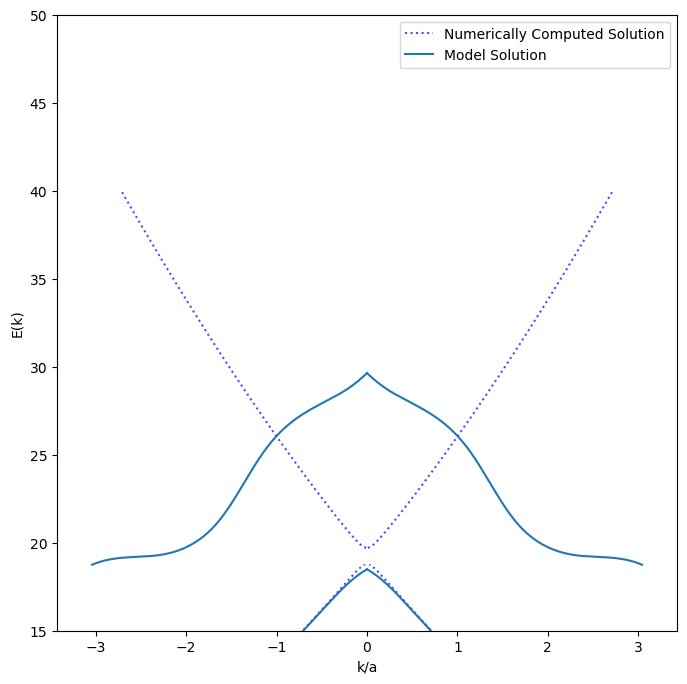

In [16]:
plot.figure(figsize = (8,8))    
plot.rcdefaults()
#plot.rcParams['axes.edgecolor'] = 'red'
plot.rcParams['figure.facecolor'] = 'white'

a = (b2) # A IS THE PERIOD
b = b1
v0 = V

dx = 0.1

energy_array = linspace(0.1,40,1000)
#Calulate the positive k values
k_vals = array([bandfunc(a,b,energy,v0) for energy in energy_array])
#The negative k-values are just a mirror image of the positive ones
neg_k_vals = array([-k if k is not None else None for k in k_vals])


plt.plot(k_vals,energy_array,'b',alpha=0.7,linestyle=':',label='Numerically Computed Solution');
plt.plot(neg_k_vals,energy_array,'b',alpha=0.7,linestyle=':');
    

#plotys = finiteWell(torch.tensor(plotxs),V,b1,b2)
modelxs = torch.linspace(0,period,samplePoints).reshape(-1,1).cuda()
modelks = torch.linspace(0,cellsize-dx,samplePoints).reshape(-1,1).cuda()
plotks = torch.linspace(0,cellsize-dx,samplePoints).reshape(-1,1).cuda()


modelSolution, lj, nfe, delta  = b1model(modelxs,modelks)
plot.plot(modelks.cpu().detach().numpy(),lj.cpu().detach().numpy(),color='C0',label='Model Solution')

#modelSolution, lj, nfe, delta  = b1model(modelxs,-1*modelks)
plot.plot(-1*modelks.cpu().detach().numpy(),lj.cpu().detach().numpy(),color='C0')

########################################################################

modelxs = torch.linspace(0,period,samplePoints).reshape(-1,1).cuda()
modelks = torch.linspace(dx+cellsize,2*cellsize,samplePoints).reshape(-1,1).cuda()
plotks = torch.linspace(dx+cellsize,2*cellsize,samplePoints).reshape(-1,1).cuda()


modelSolution, lj, nfe, delta  = b1model(modelxs,modelks)
plot.plot(modelks.cpu().detach().numpy()-2*cellsize,lj.cpu().detach().numpy(),color='C0')

#modelSolution, lj, nfe, delta  = b1model(modelxs,-1*modelks)
plot.plot(-1*modelks.cpu().detach().numpy()+2*cellsize,lj.cpu().detach().numpy(),color='C0')

# ########################################################################

modelxs = torch.linspace(0,period,samplePoints).reshape(-1,1).cuda()
modelks = torch.linspace(dx+2*cellsize,3*cellsize,samplePoints).reshape(-1,1).cuda()
plotks = torch.linspace(dx+2*cellsize,3*cellsize,samplePoints).reshape(-1,1).cuda()


modelSolution, lj, nfe, delta  = b1model(modelxs,modelks)
plot.plot(modelks.cpu().detach().numpy()-3*cellsize,lj.cpu().detach().numpy(),color='C0')

#modelSolution, lj, nfe, delta  = b1model(modelxs,-1*modelks)
plot.plot(-1*modelks.cpu().detach().numpy()+3*cellsize,lj.cpu().detach().numpy(),color='C0')

#plot.xlim([-2,2])
plot.legend(loc='upper right')
plot.ylim([15,50])
plot.xlabel('k/a')
plot.ylabel('E(k)')

/n/home00/circehsu/.conda/envs/torch-11.6/lib/python3.10/site-packages/torch/_tensor.py:759: ComplexWarning: Casting complex values to real discards the imaginary part
  return self.numpy().astype(dtype, copy=False)
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
/n/home00/circehsu/.conda/envs/torch-11.6/lib/python3.10/site-packages/torch/_tensor.py:759: ComplexWarning: Casting complex values to real discards the imaginary part
  return self.numpy().astype(dtype, copy=False)
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
/n/home00/circehsu/.conda/envs/torch-11.6/lib/python3.10/site-packages/torch/_tensor.py:759: ComplexWarning: Casting complex values to real discards the imaginary part
  return self.numpy().astype(dtype, copy=False)
No artists with labels found to put in

NameError: name 'imageio' is not defined

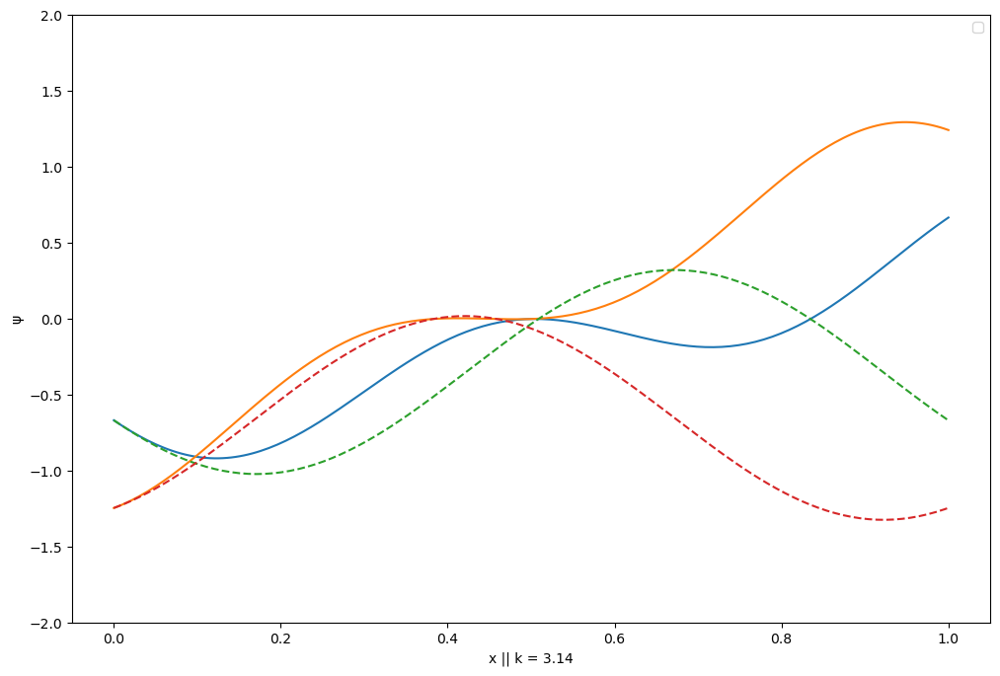

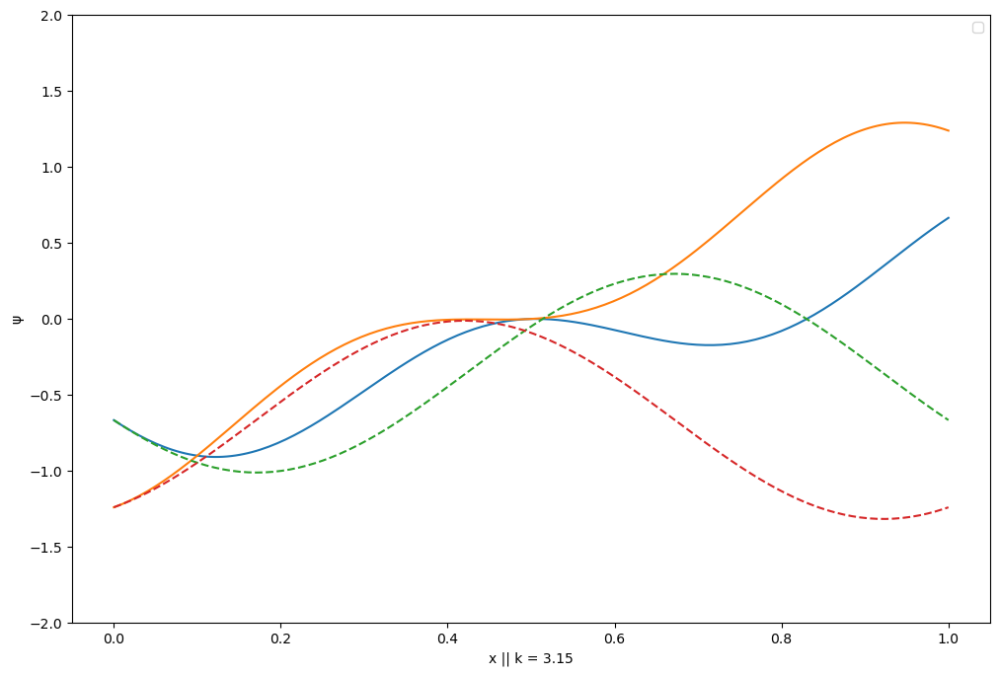

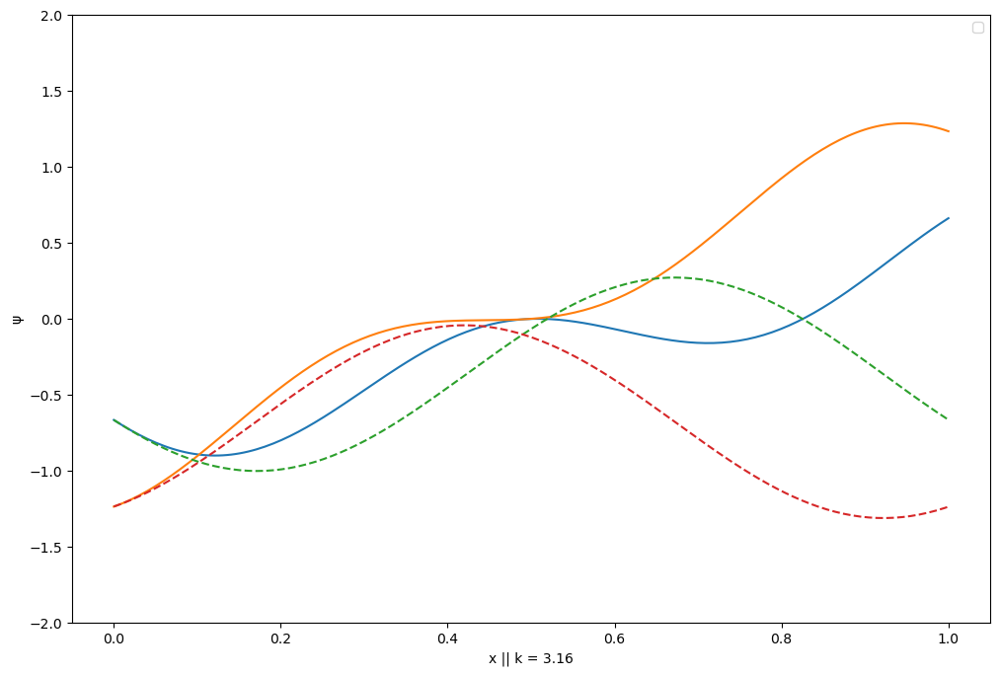

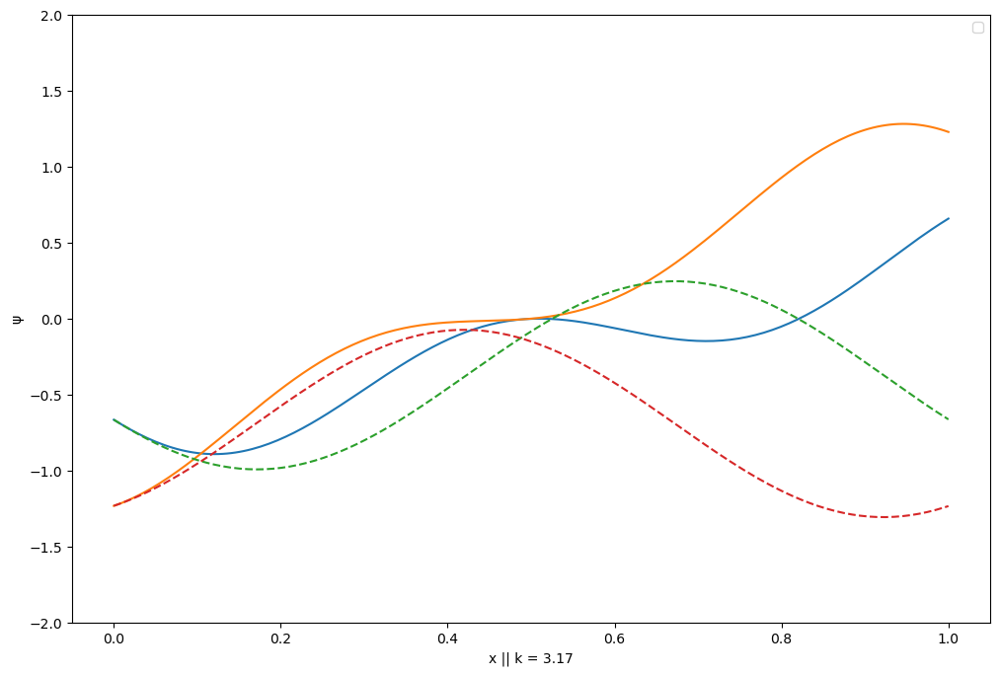

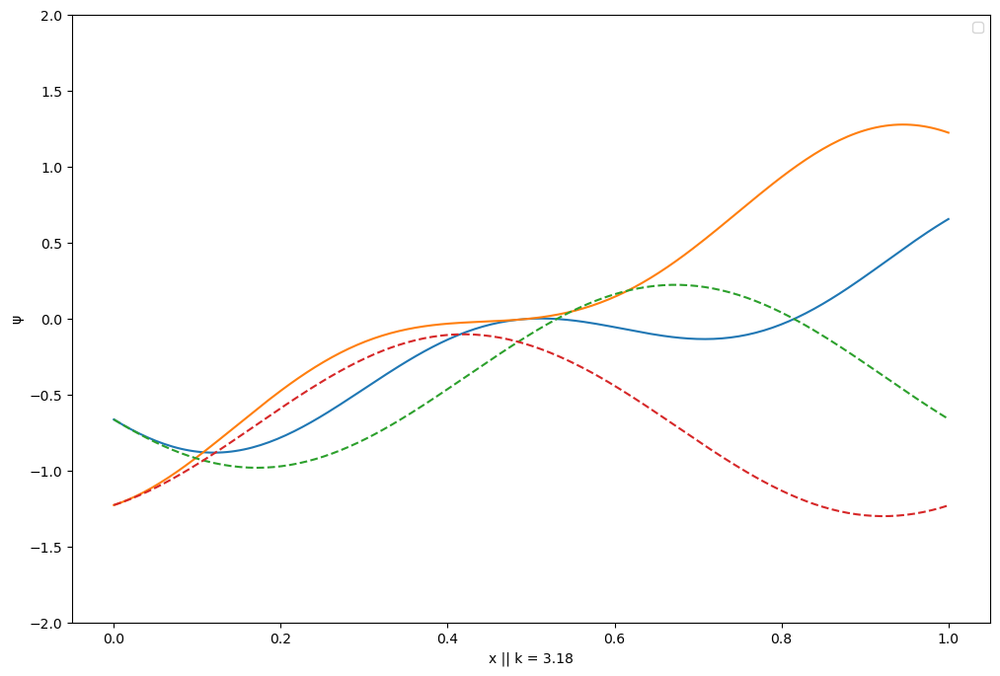

...

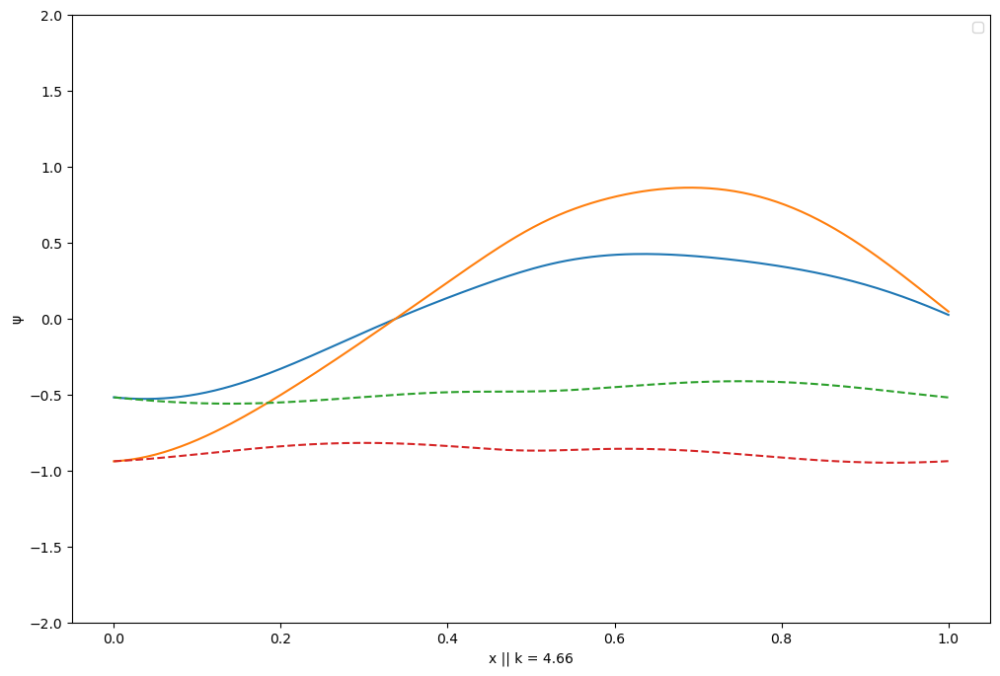

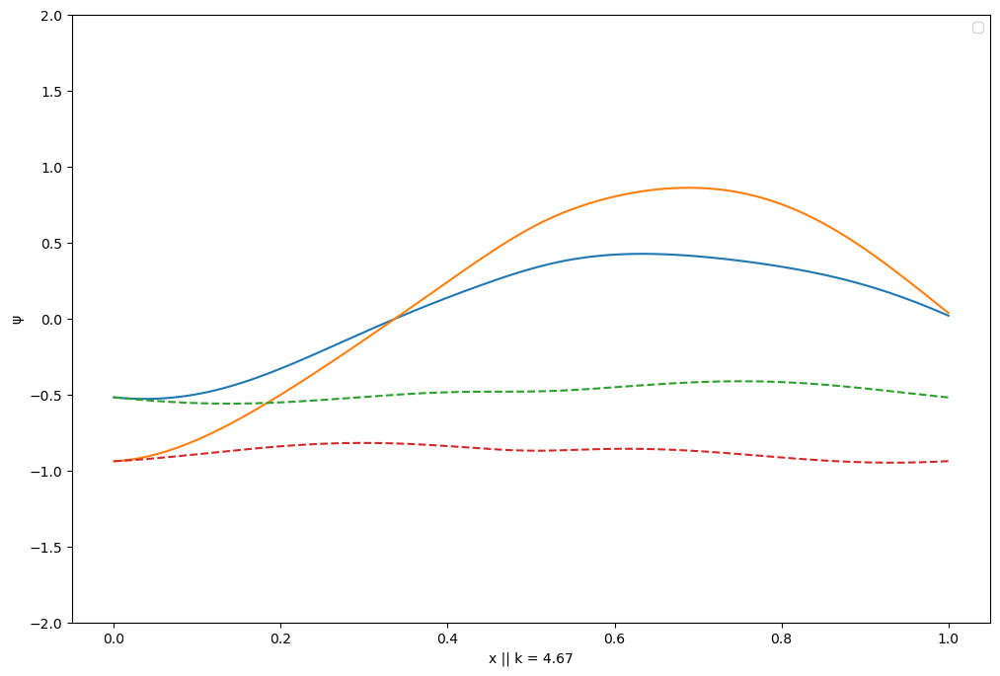

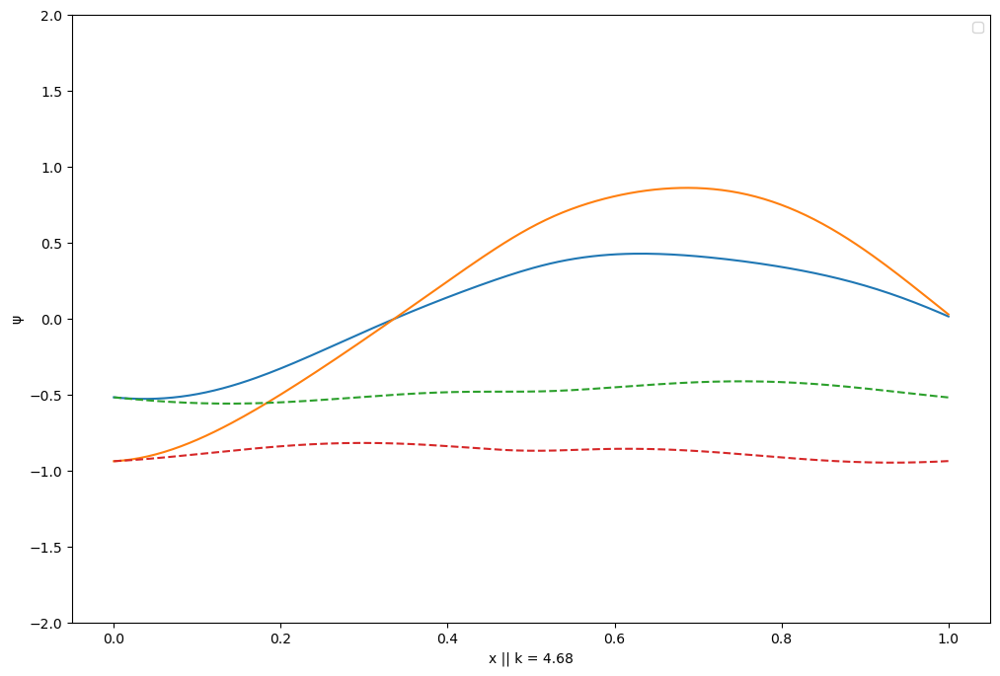

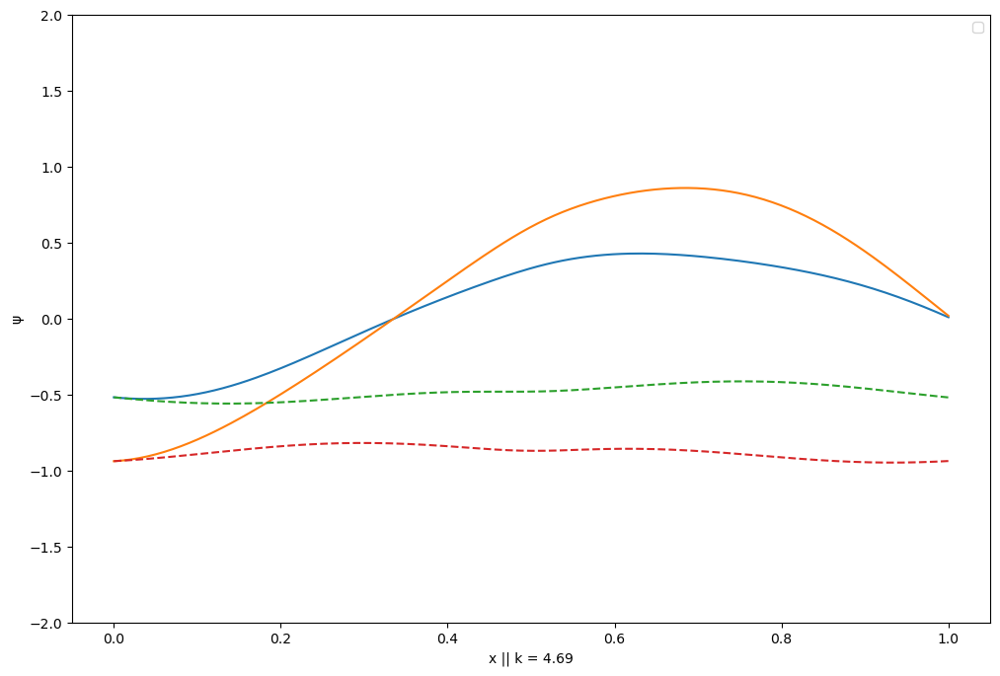

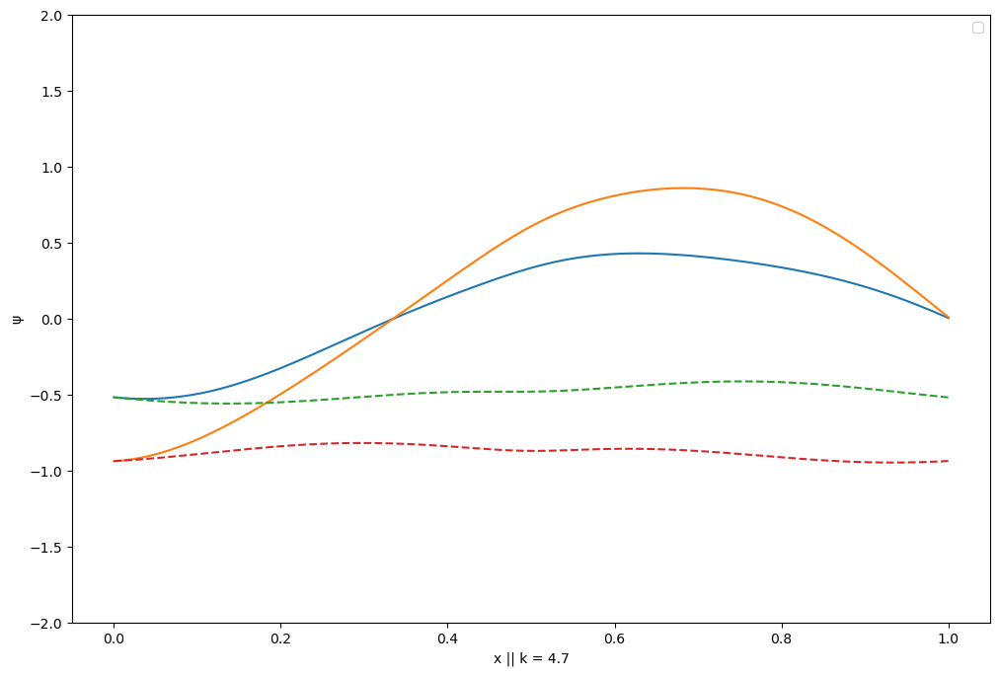

In [17]:
import time 
filenames = []

model = b1model
i = 0 ; kval = 3.14 ; j = 0
for j in range(157):

    plot.figure(figsize = (12,8))
    plot.rcdefaults()
#plot.rcParams['axes.edgecolor'] = 'red'
    plot.rcParams['figure.facecolor'] = 'white'
#plotys = finiteWell(torch.tensor(plotxs),V,b1,b2)
#modelxs = b2*((torch.rand(samplePoints)).reshape(-1,1))-b1
    modelxs = torch.linspace(0,period,samplePoints).reshape(-1,1).cuda()
    modelks = torch.linspace(kval,kval,samplePoints).reshape(-1,1).cuda()
    modelSolution, lj, nfe, delta = model(modelxs,modelks)
    paraSolution = np.exp(1j*kval*modelxs.cpu())*modelSolution.cpu().detach().numpy()
    plot.plot(modelxs.cpu(),paraSolution)
    plot.plot(modelxs.cpu(),modelSolution.cpu().detach().numpy(), linestyle='--')


    #plot.xlim([-1,3])
    plot.ylim([-2,2])
    plot.legend(loc='upper right')
    plot.xlabel('x || k = ' + str(round(kval,5)))
    plot.ylabel('ψ')
    
    plot.savefig('MAKEGIF/imag_'+str(i)+'.png')
    filenames.append('MAKEGIF/imag_'+str(i)+'.png')
    
    
    i = i+1
    kval = kval+(0.01)
    time.sleep(0.2)
    
with imageio.get_writer('gif.gif', mode='I',fps=15) as writer:
    for filename in filenames:
        image = imageio.imread(filename)
        writer.append_data(image)

#### 